<!-- In this notebook, a scope for the ArI dataset is geneyieldd using the clustering approach introduced by Doyle and co-workers (JACS 2022, 144, 1045-1055). The results are then analyzed. -->

In this notebook, we will select scopes for the amide datasets using the clustering algorithm reported by Doyle and co-workers (J. Am. Chem. Soc. 2022, 144 (2), 1045–1055).

In [1]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join('..','..','..')))
from pathlib import Path
import pandas as pd
import numpy as np
from scipy.cluster import hierarchy
from umap import UMAP
import seaborn as sns
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem import AllChem
from sklearn.preprocessing import scale
from scipy.spatial.distance import cdist
from Code.predictor import ScopeBO
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import colorsys


# Doyle colors
doyle_colors = ["#CE4C6F", "#1561C2", "#188F9D","#C4ADA2","#515798", "#CB7D85", "#A9A9A9"]
# extension of palette with lighter and darker versions
def adjust_lightness(color, factor=1.2):
    """
    Function to make colors lighter (factor > 1) or darker (factor < 1).
    """
    r, g, b = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    l = max(0, min(1, l * factor))
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return mcolors.to_hex((r, g, b))

lighter = [adjust_lightness(c, 1.2) for c in doyle_colors]
darker  = [adjust_lightness(c, 0.7) for c in doyle_colors]
all_colors = doyle_colors + darker[::-1] + lighter[::-1] 

# Save the categorical colormap
cat_cmap = ListedColormap(all_colors, name="Doyle_cat")
plt.colormaps.register(cat_cmap)

# Define and save a continuous colormap
colors = [doyle_colors[1],"#FFFFFFD1",doyle_colors[0]]
cont_cmap = LinearSegmentedColormap.from_list("Doyle_cont", colors)
plt.colormaps.register(cont_cmap)

# General plt parameters
plt.rcParams.update({
    "axes.titlesize": 20,        # Subplot title
    "axes.labelsize": 16,        # X and Y labels
    "figure.titlesize": 24,      # Suptitle
    "xtick.labelsize": 14,       # X tick labels
    "ytick.labelsize": 14,       # Y tick labels
    "legend.fontsize": 14,       # Legend text
    "legend.title_fontsize": 14, # Legend titles
    "font.family": "Helvetica"   # Font
    })

In [2]:
# function to show the molecular structure of the selected compounds
def generate_representation(smiles_list,common_core="c1ccccc1I"):
    # Convert to molecules
    mol_list = [Chem.MolFromSmiles(smiles) for smiles in smiles_list]

    # Generate 2D coordinates for all mols
    for mol in mol_list:
        AllChem.Compute2DCoords(mol)

    # Define iodobenzene substructure for alignment
    core = Chem.MolFromSmarts(common_core)
    AllChem.Compute2DCoords(core)

    # Align each molecule to the substructure if it matches
    for mol in mol_list:
        if mol.HasSubstructMatch(core):
            AllChem.GenerateDepictionMatching2DStructure(mol, core)

    return mol_list

In [3]:
# define a couple things
objectives = ["yield"]
directory = "."
wdir = Path(directory)
datasets = ["high","medium","low"]

Scale the data and make UMAPs

In [4]:
dfs_labelled = {}
dfs_clustering = {}
dfs_umap = {}
for dset in datasets:
    # Load the data (pre-processing was already carried out in the curation of the read-in dataset)
    dfs_labelled[dset] = pd.read_csv(f"./../Amide_data/Datasets/amide_dset_dft_subs_{dset}-yielding.csv", index_col=0,header=0)
    dfs_clustering[dset] = dfs_labelled[dset].copy(deep=True)
    dfs_clustering[dset] = dfs_clustering[dset].drop(columns='yield')  # drop the objective values

    # Scale the data
    dfs_clustering[dset] = pd.DataFrame(scale(dfs_clustering[dset]),dfs_clustering[dset].index,dfs_clustering[dset].columns)

    # make a UMAP for the dataset
    fit = UMAP(n_neighbors=40,min_dist=0.7,n_components=2,metric="euclidean",random_state=12)
    dfs_umap[dset] = pd.DataFrame(fit.fit_transform(dfs_clustering[dset]),dfs_clustering[dset].index,["UMAP1","UMAP2"])
    if dset == "high":  # The compounds and features are the same per dataset. Therefore only called once.
        print(f"There are {len(dfs_clustering[dset].columns)} dimensions in each dataset.") 

There are 76 dimensions in each dataset.


Determine the representation and number of clusters with the silhouette score.

In [5]:
# define the dimensionalities of the reduced representation to study
dims = [76, 70, 60, 50, 40, 30, 25, 20, 15, 10, 5, 2]

# function to calculate silhouette scores
def silhouette_scores_hierarchical(data, n_cls_list):
    """helper function to compute a silhouette score for hierarchical clustering using Ward linkage"""
    z = linkage(data, method='ward')
    result = pd.Series(index=n_cls_list, dtype=float)
    for n_cls in n_cls_list:
        cls = fcluster(z, n_cls, criterion='maxclust')
        result.loc[n_cls] = silhouette_score(data, cls)
    return result

# dictionary to store data at different levels of dimensionality reduction
dfs_dim={}
# dimensionality reduction
for dset in datasets:
    n_neighbors = int(np.sqrt(dfs_clustering[dset].shape[1]))
    dfs = {}
    for dim in dims:
        key = f"umap{dim}"
        dfs[key] = pd.DataFrame(UMAP(n_components=dim, n_neighbors=n_neighbors,
                                      random_state=0).fit_transform(dfs_clustering[dset]),index=dfs_clustering[dset].index)
    dfs_dim[dset] = dfs

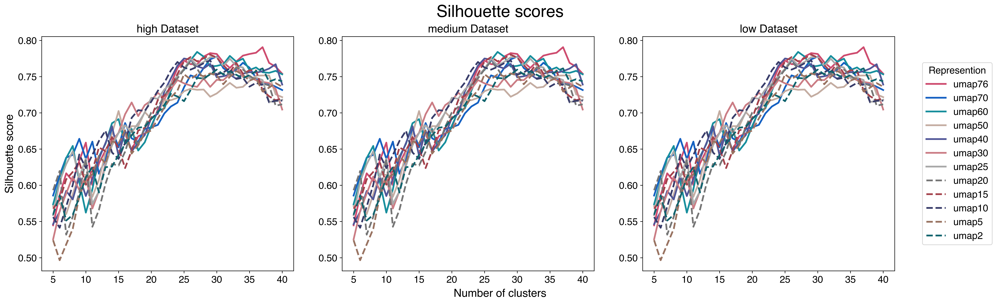

,Representation,Nr_clusters,Silh_score,Representation (min 15 clusters),Nr_clusters (min 15 clusters),Silh_score (min 15 clusters)
high,umap76,37.0,0.790673,umap76,37.0,0.790673
medium,umap76,37.0,0.790673,umap76,37.0,0.790673
low,umap76,37.0,0.790673,umap76,37.0,0.790673


In [6]:
# range of scope sizes to be studied
N_CLS_list = list(range(5,41))
# min number of clusters for the scope
min_clust = 15
all_silh_scores = {}
# df to save the results of the silhouette score analysis
best_silh_scores = pd.DataFrame(np.nan,index=datasets,columns=["Representation","Nr_clusters", "Silh_score",
                                                               f"Representation (min {min_clust} clusters)", 
                                                               f"Nr_clusters (min {min_clust} clusters)",
                                                               f"Silh_score (min {min_clust} clusters)"])

fig,axes = plt.subplots(1,4,figsize=(20,6),gridspec_kw={'width_ratios': [1, 1, 1, 0.3],"wspace": 0.1},
                        constrained_layout=True,dpi=600)
fig.suptitle("Silhouette scores")
fig.supxlabel("Number of clusters",fontsize=16)
for i,dset in enumerate(datasets):
    # populate silhouette scores for all number of clusters and all dimensionality reductions
    silh_scores = pd.DataFrame(index=N_CLS_list)
    all_silh_scores[dset] = silh_scores
    for key, value in dfs_dim[dset].items():
        silh_scores[key] = silhouette_scores_hierarchical(value, N_CLS_list)
    ax = axes[i]
    for j,col in enumerate(silh_scores.columns):
        style = '-' if j <= 6 else '--' if j <= 13 else ':'
        plotting = silh_scores[col][silh_scores[col].notna()]
        axes[i].plot(plotting.index, plotting.values, label = col, color=all_colors[j], linestyle=style, linewidth=2.5)
    axes[i].set_title(f"{dset} Dataset",fontsize=16)
    if i == 0:
        handles_collected, labels_collected = axes[i].get_legend_handles_labels()
        ax.set_ylabel("Silhouette score")
    else:
        ax.set_ylabel("")
    axes[3].axis('off')
    axes[3].legend(handles=handles_collected, labels=labels_collected, title = "Represention",
                                                        fontsize=14, loc='center')
    
    # record the representation that gives the best silhouette score
    max_position = silh_scores.stack().idxmax()
    best_silh_scores.loc[dset,"Representation"] = max_position[1]
    best_silh_scores.loc[dset,"Nr_clusters"] = int(max_position[0])
    best_silh_scores.loc[dset,"Silh_score"] = silh_scores.max().max()
    silh_scores_pruned = silh_scores.loc[silh_scores.index >= min_clust]
    max_position_pruned = silh_scores_pruned.stack().idxmax()
    best_silh_scores.loc[dset,f"Representation (min {min_clust} clusters)"] = max_position_pruned[1]
    best_silh_scores.loc[dset,f"Nr_clusters (min {min_clust} clusters)"] = int(max_position_pruned[0])
    best_silh_scores.loc[dset,f"Silh_score (min {min_clust} clusters)"] = silh_scores_pruned.max().max()

plt.show()

best_silh_scores

The silhouette score is maximized using 37 clusters. The results are the same for all three datasets as each dataset contains the same substrates and they are therefore equivalent in the clustering process as it does not consider the yield data.

Do the clustering

In [7]:
# do the clustering and assign clusters to each sample
for dset in datasets:
    # Get the  best embedding.
    embedding = best_silh_scores.loc[dset,f"Representation (min {min_clust} clusters)"]
    nr_clusters = best_silh_scores.loc[dset,f"Nr_clusters (min {min_clust} clusters)"]

    # Clustering
    z = hierarchy.linkage(dfs_dim[dset][embedding],method ="ward",metric="euclidean")
    clusters = hierarchy.fcluster(z,nr_clusters,criterion="maxclust")
    
    # Assign to samples
    dfs_clustering[dset]["clusters"] = clusters
    dfs_umap[dset]["clusters"] = clusters

Visualization of the clusters:


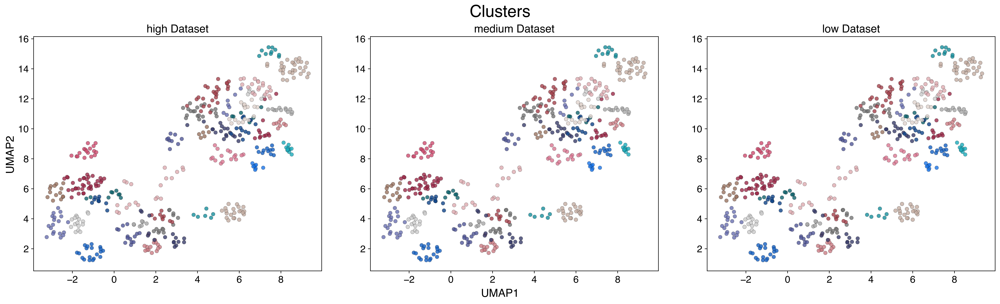

Please note that some of the clusters only differ in the shade due to the large number of clusters and part of the colors is used for two clusters.


In [8]:
def draw_clusters(cluster_column, all_colors=all_colors):

    # draw the clusters
    print("Visualization of the clusters:")

    # making sure that the colors don't run out
    all_colors = all_colors * 100


    fig,axes = plt.subplots(1,3,figsize=(20,6),gridspec_kw={"wspace": 0.1},constrained_layout=True,dpi=600)
    fig.suptitle("Clusters")
    fig.supxlabel("UMAP1",fontsize=16)
    for i,dset in enumerate(datasets):
        ax = axes[i]
        for cluster_id in sorted(dfs_umap[dset][cluster_column].unique()):
            color_id = cluster_id-1  # colors are zero-index, but clusters one-indexed
            cluster_data = dfs_umap[dset][dfs_umap[dset][cluster_column] == cluster_id]
            ax.scatter(
                cluster_data['UMAP1'], cluster_data['UMAP2'],
                color=all_colors[cluster_id],
                label=f'Cluster {cluster_id}',
                s=30, alpha=0.8, edgecolor='k', linewidth=0.2
            )
        ax.set_title(f"{dset} Dataset",fontsize=16)
        if i == 0:
            ax.set_ylabel("UMAP2")
        else:
            ax.set_ylabel("")
    plt.show()
    print("Please note that some of the clusters only differ in the shade due to the large number of clusters and part of the colors is used for two clusters.")

draw_clusters(cluster_column="clusters")

In [9]:
# load the normalization bounds
df_bounds = pd.read_csv(f"./../Amide_data/Datasets/bounds_subs.csv",index_col=0)
print("Normalization bounds:")
df_bounds.iloc[:2].apply(lambda x: x*100)

Normalization bounds:


,high,medium,low
obj_min,52.463461,34.432219,15.295950
obj_max,70.584867,44.151682,34.736403


In [10]:
# define a function to extract the relevant bounds
def get_bounds(dset):
    bounds = {}
    # get the metrics for the yield objective
    bounds["yield"] = (df_bounds.loc["obj_max",dset],df_bounds.loc["obj_min",dset])
    # get the metrics for the vendi score
    bounds["vendi"] = (df_bounds.loc["vendi_max",dset],df_bounds.loc["vendi_min",dset])

    return bounds

# function to calculate the scope score
def calculate_scope_score(av_yield,Vendi_score,bounds):
    scaled_yield = (av_yield - bounds["yield"][1])/(bounds["yield"][0] - bounds["yield"][1])
    scaled_Vendi = (Vendi_score - bounds["vendi"][1])/(bounds["vendi"][0] - bounds["vendi"][1])

    return scaled_yield * scaled_Vendi

Compute the results for the clustering scopes

In [11]:
# calculate the center-most point of each cluster and the Vendi score for the resulting samples
scope_results_silh = pd.DataFrame(np.nan,index=datasets,columns=["Average yield (%)","Vendi score","Scope score"])
dfs_vendi = {}

for dset in datasets:
    cluster_yields = [] # list to save the yields
    dfs_vendi[dset] = dfs_labelled[dset].copy(deep=True)
    dfs_vendi[dset]["yield"] = "PENDING"  # reset the yield data so that only the selected points will have a yield
    for cluster in range(max(dfs_clustering[dset]["clusters"].unique())):  # loop through all clusters
        cluster = cluster+1  # +1 because the range object is 0-indexed whereas the cluster are 1-indexed
        df_cluster = dfs_clustering[dset].loc[dfs_clustering[dset]["clusters"]== cluster]  # look at the points in the current cluster
        df_cluster = df_cluster.drop(columns=["clusters"])  # drop the cluster column to only keep the features (df_clustering did not contain the yield data)
        centroid = df_cluster.mean().values  # this is the center of the cluster
        distances = cdist(df_cluster,[centroid],metric="cityblock").flatten()  # calculate the distances to the center
        df_cluster["distances"] = distances
        centermost_point = df_cluster[df_cluster["distances"] == df_cluster["distances"].min()].index.item()  # get the center-most point
        yield_clusterpoint = dfs_labelled[dset].at[centermost_point,"yield"]  # get the yield data for the center-most point
        dfs_vendi[dset].loc[centermost_point,"yield"] = "1"  # put a label for the vendi score calculation (value is not important)
        cluster_yields.append(yield_clusterpoint)  # save the point
    av_yield = sum(cluster_yields)/len(cluster_yields)
    scope_results_silh.loc[dset,"Average yield (%)"] = av_yield*100
    dfs_vendi[dset].to_csv(wdir.joinpath("df_clustering_vendi.csv"),index=True,header=True)  # save the file (as the Vendi score calculation needs a file as input)
    Vendi_score = ScopeBO().get_vendi_score(objectives=["yield"],directory=".",filename="df_clustering_vendi.csv")  # calculate the vendi score
    scope_results_silh.loc[dset,"Vendi score"] = Vendi_score
    bounds = get_bounds(dset)
    scope_score = calculate_scope_score(av_yield,Vendi_score,bounds)
    scope_results_silh.loc[dset,"Scope score"] = scope_score

In [12]:
def draw_scope(save_umap=True, title = "Selected scopes (maximized silhouette score)"):
    fig, axes = plt.subplots(1, 3, figsize=(20,6),
                             gridspec_kw={"wspace": 0.1},
                             constrained_layout=True, dpi=600)
    fig.suptitle(title)
    fig.supxlabel("UMAP1", fontsize=16)

    for i, dset in enumerate(datasets):
        ax = axes[i]

        # only keep the yield label for evaluated points
        dfs_umap[dset]["yield"] = dfs_labelled[dset]["yield"]

        # save the umap data
        if save_umap:
            dfs_umap[dset].to_csv(f"./../Amide_data/Datasets/umap_subs_{dset}.csv", index=True, header=True)

        # remove labels for unseen substrate pairs
        for idx in dfs_vendi[dset].index:
            if dfs_vendi[dset].loc[idx, "yield"] == "PENDING":
                dfs_umap[dset].loc[idx, "yield"] = "PENDING"

        # Separate selected and unseen examples
        df_numeric = dfs_umap[dset][pd.to_numeric(dfs_umap[dset]['yield'], errors='coerce').notna()].copy()
        df_numeric['yield'] = df_numeric['yield'].astype(float)*100
        df_pending = dfs_umap[dset][pd.to_numeric(dfs_umap[dset]['yield'], errors='coerce').isna()]

        vmin = dfs_labelled[dset]['yield'].min()*100
        vmax = dfs_labelled[dset]['yield'].max()*100
        norm = plt.Normalize(vmin, vmax)
        cmap = sns.color_palette("Doyle_cont", as_cmap=True)

        # Plot unseen entries
        ax.scatter(df_pending["UMAP1"], df_pending["UMAP2"],
                   color=all_colors[6], s=20, alpha=0.4, label="PENDING")

        # Plot selected entries
        scatter_numeric = ax.scatter(df_numeric["UMAP1"], df_numeric["UMAP2"],
                                     c=df_numeric["yield"], cmap=cmap, norm=norm,
                                     s=100, alpha=1, edgecolor='k', linewidth=1)

        # Add colorbar
        cbar = fig.colorbar(scatter_numeric, ax=ax)
        cbar.set_label("Yield (%)")

        ax.set_title(f"{dset} dataset")
        if i == 0:
            ax.set_ylabel("UMAP2")

    plt.tight_layout()
    plt.show()


Draw the scopes

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


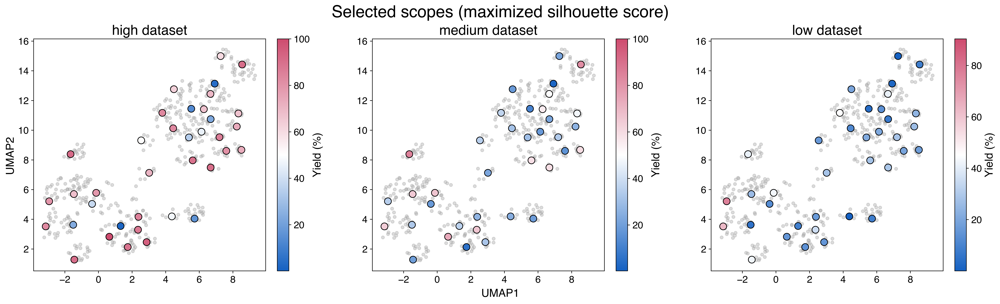

Scope results:


,high,medium,low
Average yield (%),64.606,37.988,22.528
Vendi score,4.598,4.598,4.598
Scope score,0.167,0.091,0.092


In [13]:
saved_ax = draw_scope()
print("Scope results:")
scope_results_silh.T.applymap(lambda x: round(x,3))

In [14]:
print("Normalization bounds for the yields for comparison:")
df_bounds.iloc[:2].apply(lambda x: x*100)

Normalization bounds for the yields for comparison:


,high,medium,low
obj_min,52.463461,34.432219,15.295950
obj_max,70.584867,44.151682,34.736403


The scope scores are below the ones obtained with ScopeBO (high: 0.22, medium: 0.20, low: 0.20) for all three datasets. While the average yields are actually higher than the ones obtained with ScopeBO, the Vendi scores are significantly lower despite the larger number of samples (37 versus 27 for ScopeBO). 

Show example scopes for one of the datasets (the substrates are the same in each datasets and only the yields differ)

Scope for the high dataset:


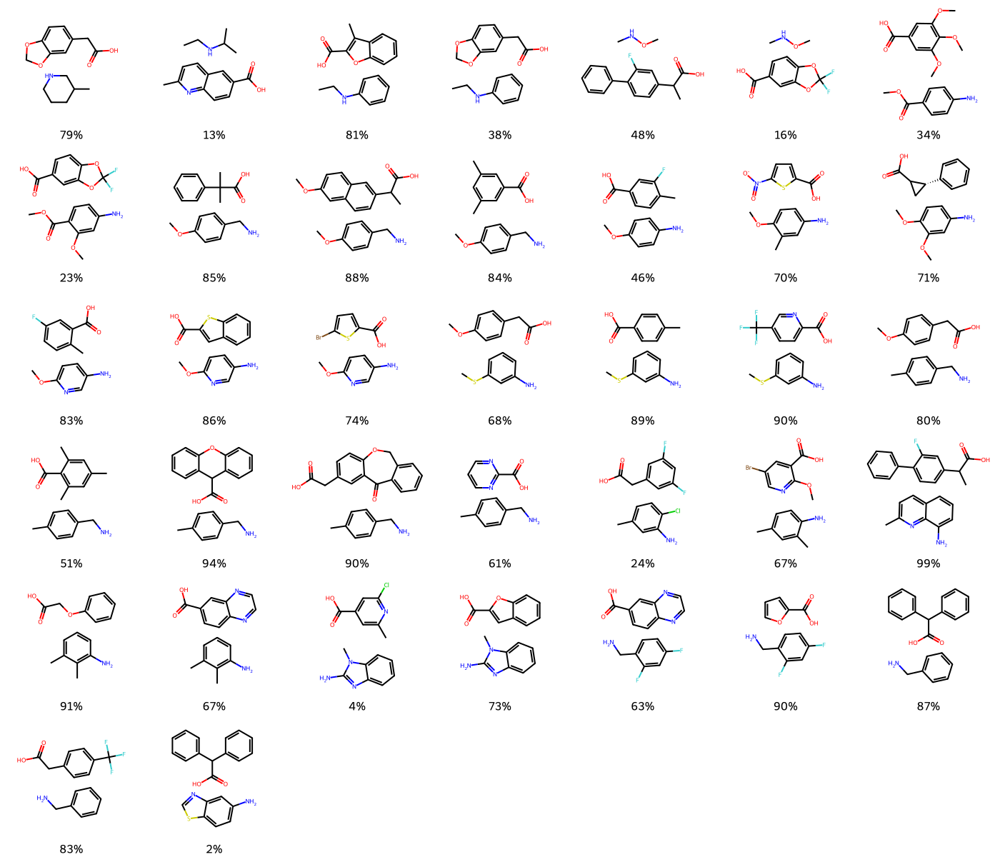

In [15]:
# show the selected molecules
dset = "high"
print(f"Scope for the {dset} dataset:")
df_selected = dfs_umap[dset].loc[dfs_umap[dset]["yield"] != "PENDING"]
mol_list = generate_representation(list(df_selected.loc[df_selected["yield"] != "PENDING"].index))
depiction = Draw.MolsToGridImage(
    mol_list,
    molsPerRow=7,
    subImgSize=(200, 200),
    legends=[f"{round(df_selected.loc[smiles,'yield']*100)}%" for smiles in df_selected.index]
    )
display(depiction)

In [16]:
# save the selected samples
for dset in datasets:
    dfs_umap[dset].to_csv(f"./Results_Data/Cluster_Scopes/scope_doyle_samples_{dset}.csv",index=True,header=True)
# save the results for the scopes
scope_results_silh.to_csv(f"./Results_Data/Cluster_Scopes/results_doyle.csv",index=True,header=True)

Redo clustering analysis with a fixed scope size of 27 samples (same as ScopeBO)

In [17]:
print("Best representation and silhouette score for a scope size of 27:"\
      f" {silh_scores.loc[27].idxmax()}; {silh_scores.loc[27].max()}")


Best representation and silhouette score for a scope size of 27: umap60; 0.7841082215309143


Notably, this silhouette score is only marginally smaller than the highest overall for scope size 37 (0.790673)

Visualization of the clusters:


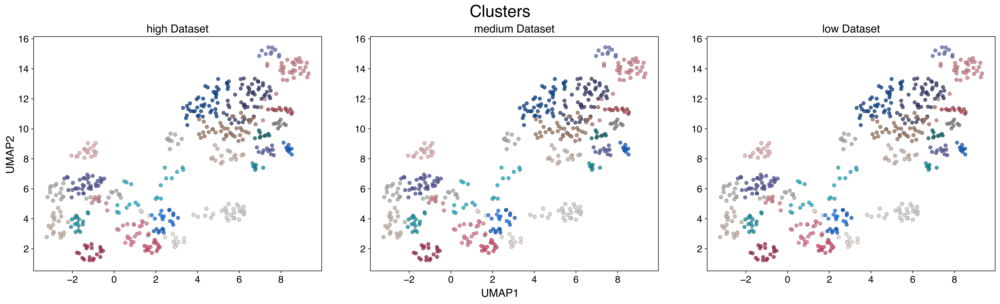

Please note that some of the clusters only differ in the shade due to the large number of clusters and part of the colors is used for two clusters.


In [18]:
# do the clustering and assign clusters to each sample
for dset in datasets:
    # Reset the clustering dataframes
    dfs_clustering[dset] = dfs_labelled[dset].copy(deep=True)
    dfs_clustering[dset] = dfs_clustering[dset].drop(columns='yield')  # drop the objective values

    # Scale the data
    dfs_clustering[dset] = pd.DataFrame(scale(dfs_clustering[dset]),dfs_clustering[dset].index,dfs_clustering[dset].columns)
    
    # Get the  best embedding.
    embedding = silh_scores.loc[27].idxmax()
    nr_clusters = 27

    # Clustering
    z = hierarchy.linkage(dfs_dim[dset][embedding],method ="ward",metric="euclidean")
    clusters = hierarchy.fcluster(z,nr_clusters,criterion="maxclust")
    
    # Assign to samples
    dfs_clustering[dset]["clusters"] = clusters
    dfs_umap[dset]["clusters27"] = clusters

draw_clusters(cluster_column="clusters27")

Despite the small difference in the silhouette score, the clustering looks much worse  than it did for the best silhouette score and 37 clusters.

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


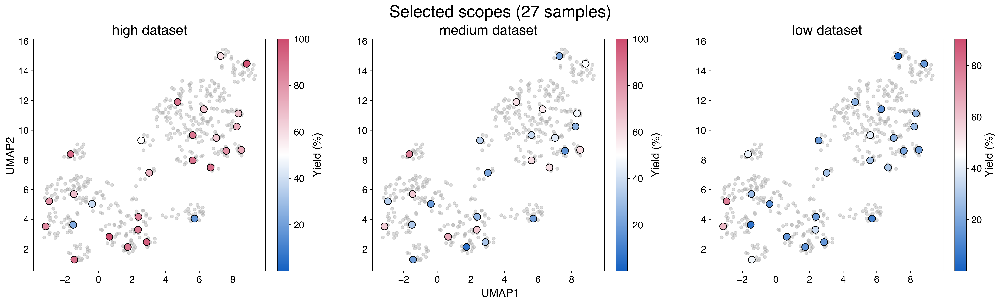

Results for clustering with a scope size of 27:


,high,medium,low
Average yield (%),74.354,42.044,24.929
Vendi score,4.465,4.465,4.465
Scope score,0.278,0.179,0.113


In [19]:
# calculate the center-most point of each cluster and the Vendi score for the resulting samples
scope_results_silh27 = pd.DataFrame(np.nan,index=datasets,columns=["Average yield (%)","Vendi score","Scope score"])
dfs_vendi = {}

for dset in datasets:
    cluster_yields = [] # list to save the yields
    dfs_vendi[dset] = dfs_labelled[dset].copy(deep=True)
    dfs_vendi[dset]["yield"] = "PENDING"  # reset the yield data so that only the selected points will have a yield
    for cluster in range(max(dfs_clustering[dset]["clusters"].unique())):  # loop through all clusters
        cluster = cluster+1  # +1 because the range object is 0-indexed whereas the cluster are 1-indexed
        df_cluster = dfs_clustering[dset].loc[dfs_clustering[dset]["clusters"]== cluster]  # look at the points in the current cluster
        df_cluster = df_cluster.drop(columns=["clusters"])  # drop the cluster column to only keep the features (df_clustering did not contain the yield data)
        centroid = df_cluster.mean().values  # this is the center of the cluster
        distances = cdist(df_cluster,[centroid],metric="cityblock").flatten()  # calculate the distances to the center
        df_cluster["distances"] = distances
        centermost_point = df_cluster[df_cluster["distances"] == df_cluster["distances"].min()].index.item()  # get the center-most point
        yield_clusterpoint = dfs_labelled[dset].at[centermost_point,"yield"]  # get the yield data for the center-most point
        dfs_vendi[dset].loc[centermost_point,"yield"] = "1"  # put a label for the vendi score calculation (value is not important)
        cluster_yields.append(yield_clusterpoint)  # save the point

    av_yield = sum(cluster_yields)/len(cluster_yields)
    scope_results_silh27.loc[dset,"Average yield (%)"] = av_yield*100
    dfs_vendi[dset].to_csv(wdir.joinpath("df_clustering_vendi.csv"),index=True,header=True)  # save the file (as the Vendi score calculation needs a file as input)
    Vendi_score = ScopeBO().get_vendi_score(objectives=["yield"],directory=".",filename="df_clustering_vendi.csv")  # calculate the vendi score
    scope_results_silh27.loc[dset,"Vendi score"] = Vendi_score
    bounds = get_bounds(dset)
    scope_score = calculate_scope_score(av_yield,Vendi_score,bounds)
    scope_results_silh27.loc[dset,"Scope score"] = scope_score

_ = draw_scope(save_umap=False, title = "Selected scopes (27 samples)")
print("Results for clustering with a scope size of 27:")
scope_results_silh27.T.applymap(lambda x: round(x,3))

Scope for the high dataset:


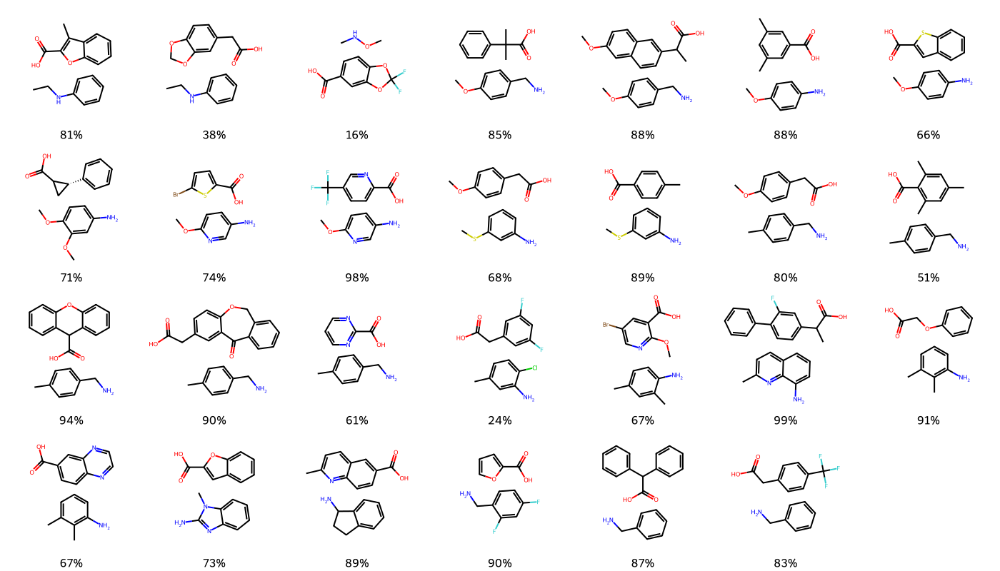

In [20]:
# show the selected molecules
dset = "high"
print(f"Scope for the {dset} dataset:")
df_selected = dfs_umap[dset].loc[dfs_umap[dset]["yield"] != "PENDING"]
mol_list = generate_representation(list(df_selected.loc[df_selected["yield"] != "PENDING"].index))
depiction = Draw.MolsToGridImage(
    mol_list,
    molsPerRow=7,
    subImgSize=(200, 200),
    legends=[f"{round(df_selected.loc[smiles,'yield']*100)}%" for smiles in df_selected.index]
    )
display(depiction)

The average yields are much higher for each dataset than with the 37-sample scope (see above) despite the very minimal difference in the silhouette score and even exceed the normalization bounds. This highlights that the average performance in the clustering scopes is highly arbitrary and by chance happens to be high in this case. In other datasets that we explored, the average yield/ rate was low.

In [21]:
# save the selected samples
for dset in datasets:
    dfs_umap[dset].to_csv(f"./Results_Data/Cluster_Scopes/scope_doyle_samples27_{dset}.csv",index=True,header=True)
# save the results for the scopes
scope_results_silh.to_csv(f"./Results_Data/Cluster_Scopes/results_doyle27.csv",index=True,header=True)